In [15]:
print("0")

0


In [16]:
# Import necessary libraries
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Download historical data for desired ticker symbol
ticker = 'AAPL'
df = yf.download(ticker, start="2015-01-01", end="2023-06-07")

# Check the data
df.tail()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-05-31,177.330002,179.350006,176.759995,177.250000,177.250000,99625300
2023-06-01,177.699997,180.119995,176.929993,180.089996,180.089996,68901800
2023-06-02,181.029999,181.779999,179.259995,180.949997,180.949997,61945900
2023-06-05,182.630005,184.949997,178.039993,179.580002,179.580002,121946500
2023-06-06,179.970001,180.119995,177.429993,179.210007,179.210007,64848400


In [17]:
# Download historical data for desired ticker symbol
ticker = 'AAPL'
df = yf.download(ticker, start="2015-01-01", end="2023-06-07")

# Check the data
df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,27.847500,27.860001,26.837500,27.332500,24.531765,212818400
2015-01-05,27.072500,27.162500,26.352501,26.562500,23.840666,257142000
2015-01-06,26.635000,26.857500,26.157499,26.565001,23.842911,263188400
2015-01-07,26.799999,27.049999,26.674999,26.937500,24.177235,160423600
2015-01-08,27.307501,28.037500,27.174999,27.972500,25.106184,237458000


In [18]:
# Define Bollinger Bands
def bollinger_bands(data, n, std, col='Close'):
    MA = data[col].rolling(window=n).mean()
    SD = data[col].rolling(window=n).std()
    
    data['BB_Upper'] = MA + (std * SD)
    data['BB_Lower'] = MA - (std * SD)
    return data

# Compute Bollinger Bands with std dev of 1 and 4
df = bollinger_bands(df, n=200, std=1)
df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
df = bollinger_bands(df, n=200, std=4)
df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

# Compute SMAs
df['SMA_9'] = df['Close'].rolling(window=21).mean()
df['SMA_21'] = df['Close'].rolling(window=50).mean()


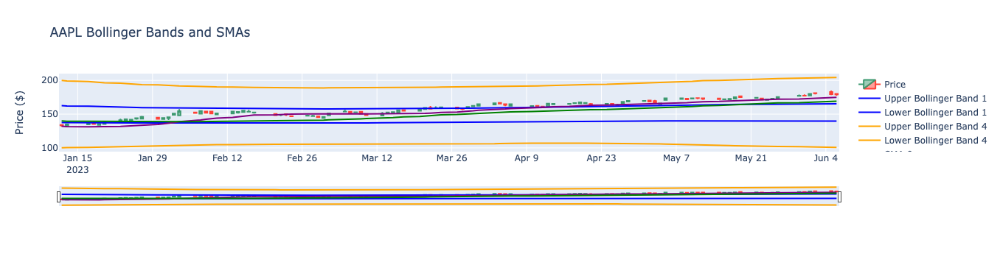

In [19]:
# Filter to the last 100 days for better visualization
df_viz = df.iloc[-100:]

# Create figure
fig = go.Figure(data=[go.Candlestick(x=df_viz.index,
                                     open=df_viz['Open'], high=df_viz['High'],
                                     low=df_viz['Low'], close=df_viz['Close'],
                                     name="Price"),
                      go.Scatter(x=df_viz.index, y=df_viz['BB_Upper1'], line=dict(color='blue'), name="Upper Bollinger Band 1"),
                      go.Scatter(x=df_viz.index, y=df_viz['BB_Lower1'], line=dict(color='blue'), name="Lower Bollinger Band 1"),
                      go.Scatter(x=df_viz.index, y=df_viz['BB_Upper4'], line=dict(color='orange'), name="Upper Bollinger Band 4"),
                      go.Scatter(x=df_viz.index, y=df_viz['BB_Lower4'], line=dict(color='orange'), name="Lower Bollinger Band 4"),
                      go.Scatter(x=df_viz.index, y=df_viz['SMA_9'], line=dict(color='purple'), name="SMA 9"),
                      go.Scatter(x=df_viz.index, y=df_viz['SMA_21'], line=dict(color='green'), name="SMA 21")])

# Update the layout to include the title and yaxis range
fig.update_layout(
    title='AAPL Bollinger Bands and SMAs',
    yaxis_title='Price ($)',
)

fig.show()

[*********************100%***********************]  1 of 1 completed


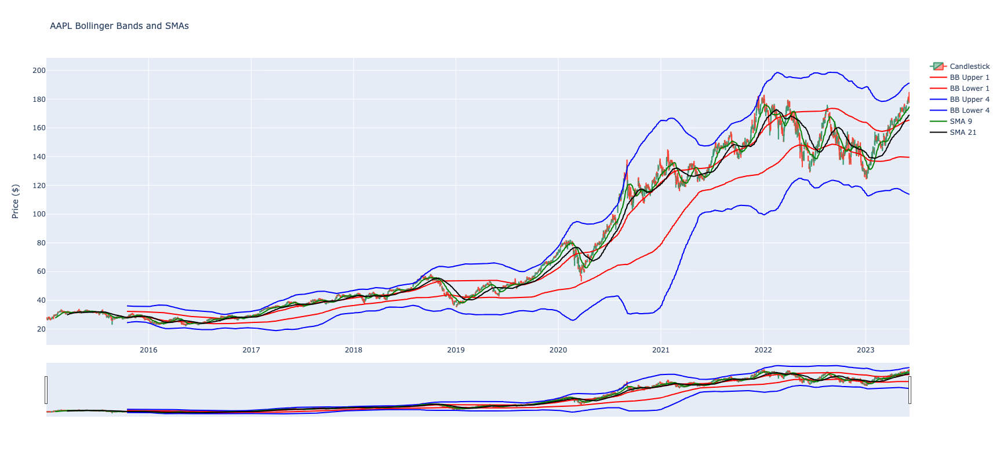

In [28]:
# Import necessary libraries
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.graph_objs as go

# Define Bollinger Bands
def bollinger_bands(data, n, std, col='Close'):
    MA = data[col].rolling(window=n).mean()
    SD = data[col].rolling(window=n).std()
    data['BB_Upper'] = MA + (std * SD)
    data['BB_Lower'] = MA - (std * SD)
    return data

# Download historical data for desired ticker symbol
ticker = 'AAPL'
df = yf.download(ticker, start="2015-01-01", end="2023-06-07")

# Compute Bollinger Bands with std dev of 1 and 4
df = bollinger_bands(df, n=200, std=1)
df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
df = bollinger_bands(df, n=200, std=3)
df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

# Compute SMAs
df['SMA_9'] = df['Close'].rolling(window=21).mean()
df['SMA_21'] = df['Close'].rolling(window=50).mean()

# Create a Candlestick chart
trace_candle = go.Candlestick(x=df.index,
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'], name = 'Candlestick')

# Create traces for Bollinger Bands and SMAs
trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'red'}, name='BB Upper 1')
trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
trace_bb_upper4 = go.Scatter(x=df.index, y=df['BB_Upper4'], line={'color': 'blue'}, name='BB Upper 4')
trace_bb_lower4 = go.Scatter(x=df.index, y=df['BB_Lower4'], line={'color': 'blue'}, name='BB Lower 4')
trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'green'}, name='SMA 9')
trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')

# Create a layout
layout = go.Layout({
    'title': {
        'text': 'AAPL Bollinger Bands and SMAs',
        'font': {
            'size': 15
        }
    },
    'yaxis': {
        'title': 'Price ($)'
    },
    'autosize': False,
    'width': 1000,
    'height': 800,
})

# Construct the figure
fig = go.Figure(data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper4, trace_bb_lower4, trace_sma_9, trace_sma_21], layout=layout)

# Plot the figure
fig.show()


[*********************100%***********************]  1 of 1 completed


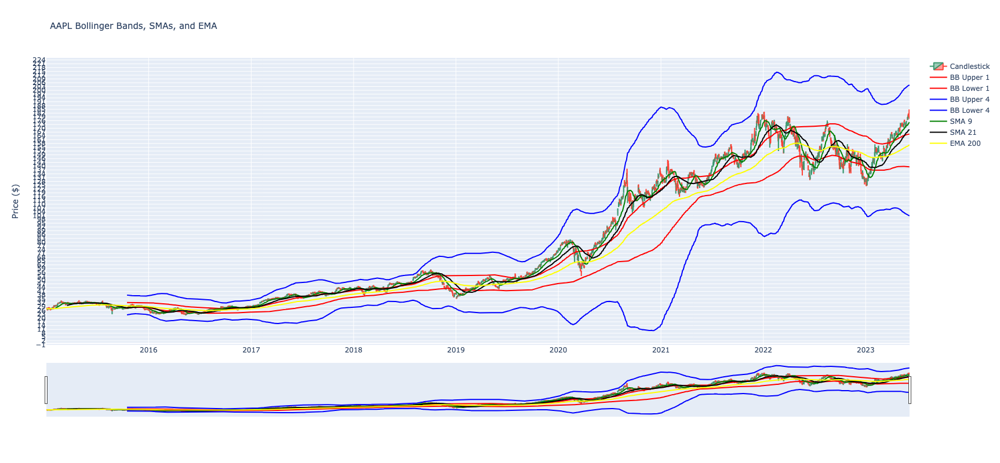

In [27]:
# Import necessary libraries
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.graph_objs as go

# Define Bollinger Bands
def bollinger_bands(data, n, std, col='Close'):
    MA = data[col].rolling(window=n).mean()
    SD = data[col].rolling(window=n).std()
    data['BB_Upper'] = MA + (std * SD)
    data['BB_Lower'] = MA - (std * SD)
    return data

# Download historical data for desired ticker symbol
ticker = 'AAPL'
df = yf.download(ticker, start="2015-01-01", end="2023-06-07")

# Compute Bollinger Bands with std dev of 1 and 4
df = bollinger_bands(df, n=200, std=1)
df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
df = bollinger_bands(df, n=200, std=4)
df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

# Compute SMAs
df['SMA_9'] = df['Close'].rolling(window=21).mean()
df['SMA_21'] = df['Close'].rolling(window=50).mean()

# Compute EMA
df['EMA_200'] = df['Close'].ewm(span=200, adjust=False).mean()

# Create a Candlestick chart
trace_candle = go.Candlestick(x=df.index,
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'], name = 'Candlestick')

# Create traces for Bollinger Bands, SMAs, and EMA
trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'red'}, name='BB Upper 1')
trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
trace_bb_upper4 = go.Scatter(x=df.index, y=df['BB_Upper4'], line={'color': 'blue'}, name='BB Upper 4')
trace_bb_lower4 = go.Scatter(x=df.index, y=df['BB_Lower4'], line={'color': 'blue'}, name='BB Lower 4')
trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'green'}, name='SMA 9')
trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')
trace_ema_200 = go.Scatter(x=df.index, y=df['EMA_200'], line={'color': 'yellow'}, name='EMA 200')

# Create a layout
layout = go.Layout({
    'title': {
        'text': 'AAPL Bollinger Bands, SMAs, and EMA',
        'font': {
            'size':15
        }
    },
    'yaxis': {
        'title': 'Price ($)',
        'tick0': 50,
        'dtick': 3
    },
    'autosize': False,
    'width': 1000,
    'height': 800,
})

# Construct the figure
fig = go.Figure(data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper4, trace_bb_lower4, trace_sma_9, trace_sma_21, trace_ema_200], layout=layout)

# Plot the figure
fig.show()


[*********************100%***********************]  1 of 1 completed


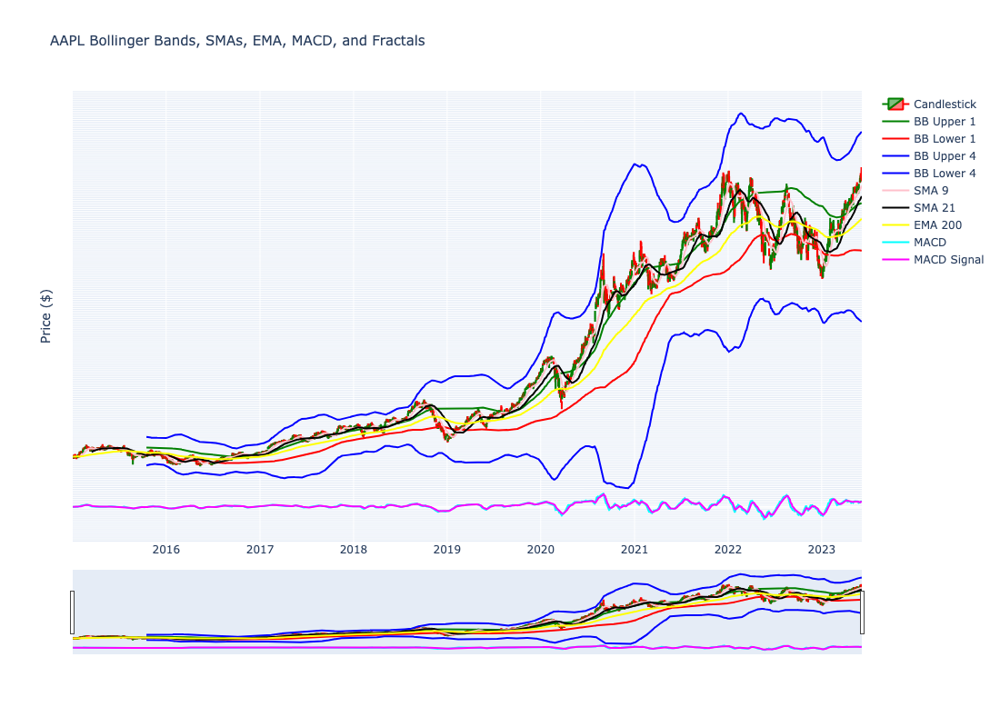

In [35]:
# Import necessary libraries
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.graph_objs as go

# Define Bollinger Bands
def bollinger_bands(data, n, std, col='Close'):
    MA = data[col].rolling(window=n).mean()
    SD = data[col].rolling(window=n).std()
    data['BB_Upper'] = MA + (std * SD)
    data['BB_Lower'] = MA - (std * SD)
    return data

# Compute MACD
def compute_macd(data, short=12, long=26):
    short_ema = data.ewm(span=short, adjust=False).mean()
    long_ema = data.ewm(span=long, adjust=False).mean()
    macd = short_ema - long_ema
    signal = macd.ewm(span=9, adjust=False).mean()
    return macd, signal

# Calculate Williams Fractals
def compute_fractals(data, period=2):
    high_fractal = data['High'].rolling(window=2*period+1, center=True).max()
    low_fractal = data['Low'].rolling(window=2*period+1, center=True).min()
    data['Fractal_Bull'] = data['High'] >= high_fractal
    data['Fractal_Bear'] = data['Low'] <= low_fractal
    return data

# Download historical data for desired ticker symbol
ticker = 'AAPL'
df = yf.download(ticker, start="2015-01-01", end="2023-06-07")

# Compute Bollinger Bands with std dev of 1 and 4
df = bollinger_bands(df, n=200, std=1)
df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
df = bollinger_bands(df, n=200, std=4)
df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

# Compute SMAs
df['SMA_9'] = df['Close'].rolling(window=21).mean()
df['SMA_21'] = df['Close'].rolling(window=50).mean()

# Compute EMA
df['EMA_200'] = df['Close'].ewm(span=200, adjust=False).mean()

# Compute MACD and MACD Signal
df['MACD'], df['MACD_Signal'] = compute_macd(df['Close'])

# Compute Williams Fractals
df = compute_fractals(df, period=2)

# Create a Candlestick chart
trace_candle = go.Candlestick(x=df.index,
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'], 
                increasing_line_color='green', 
                decreasing_line_color='red',
                name = 'Candlestick')

# Create traces for Bollinger Bands, SMAs, EMA, MACD, and MACD Signal
trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'green'}, name='BB Upper 1')
trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
trace_bb_upper4 = go.Scatter(x=df.index, y=df['BB_Upper4'], line={'color': 'blue'}, name='BB Upper 4')
trace_bb_lower4 = go.Scatter(x=df.index, y=df['BB_Lower4'], line={'color': 'blue'}, name='BB Lower 4')
trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'pink'}, name='SMA 9')
trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')
trace_ema_200 = go.Scatter(x=df.index, y=df['EMA_200'], line={'color': 'yellow'}, name='EMA 200')
trace_macd = go.Scatter(x=df.index, y=df['MACD'], line={'color': 'cyan'}, name='MACD')
trace_macd_signal = go.Scatter(x=df.index, y=df['MACD_Signal'], line={'color': 'magenta'}, name='MACD Signal')

# Create a layout
layout = go.Layout({
    'title': {
        'text': 'AAPL Bollinger Bands, SMAs, EMA, MACD, and Fractals',
        'font': {
            'size':15
        }
    },
    'yaxis': {
        'title': 'Price ($)',
        'tick0': 0,
        'dtick': 1,
        'showticklabels': False
    },
    'autosize': False,
    'width': 1000,
    'height': 800,
})

# Construct the figure
fig = go.Figure(data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper4, trace_bb_lower4, trace_sma_9, trace_sma_21, trace_ema_200, trace_macd, trace_macd_signal], layout=layout)

# Plot the figure
fig.show()
